<a href="https://colab.research.google.com/github/thually/MazeAlgorithms/blob/main/MazeAlgorithms_eng.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Maze Algorithms**

---

## Alejandro Salazar Mejía

---

### 🧀‍ꡌ‍ꡙ‍ꡚ‍🐁

[https://github.com/thually](https://github.com/thually)

In [ ]:
from abc import ABC, abstractmethod

class Maze(ABC):
    import networkx as nx
    def __init__(self, rows: int, cols: int, seed: int = None):
        self.rows = rows
        self.cols = cols
        self.seed = seed

    @abstractmethod
    def plot(self, show=True) -> None:
        """It plots the maze.
        Abstract method to be implemented by child classes."""
        pass

    @abstractmethod
    def generate_maze(self) -> nx.Graph:
        """Generates the maze.
        Abstract method to be implemented by the child classes."""
        pass

In [ ]:
class MazeCell:
    """ Representa una celda del laberinto.
    Para identificar una celda en el laberinto, se utiliza un par de coordenadas (x,y)."""

    def __init__(self, x: int, y: int, id: int = None):
        self.x = x
        self.y = y
        self.xy = (x,y)

        # For the Disjoint Set structure needed in Kruskal we need:
        self.parent = self
        self.rank = 0 # Upper bound of the height of its tree

        # For Kruskal's animation:
        self.id = id

        # For  Dead-end filling Algorithm
        self.visited = False
        self.color = 'white'

    def get_parent_id(self):
        return self.parent.id

    def __repr__(self) -> str:
        return f"Cell({self.x}, {self.y})"

class MazeWall:
    """ It represents a wall of the labyrinth.
    To identify a wall in the labyrinth, the pair of cells it separates is used."""

    def __init__(self, cell1: MazeCell, cell2: MazeCell):
        self.cell1 = cell1
        self.cell2 = cell2
        # We must have a Boolean variable that tells us whether the wall is in the maze or not.
        self.in_maze = True

        # For animation:
        self.color = 'black'

    def __repr__(self) -> str:
        return f"Wall[ ({self.cell1.x},{self.cell1.y}) - ({self.cell2.x},{self.cell2.y}) {self.in_maze} ]"

## **MAZE GENERATION**: Iterative randomized Kruskal's algorithm (with sets)

### Kruskal's algorithm

Kruskal's algorithm is a greedy algorithm used to find a minimum spanning forest in a weighted graph. If the graph is connected, it seeks a subset of edges that, forming a tree, include all vertices and where the value of the sum of all edges of the tree is the minimum. If the graph is not connected, then it seeks a minimum spanning forest (a minimum spanning tree for each connected component).  
The algorithm begins with an empty graph and iteratively adds the shortest edge that does not create a cycle until all vertices are connected.

These are the steps of Kruskal's algorithm:

1. Sort all the edges of the graph in non-decreasing order of their weights.
2. Initialize an empty graph to store the minimum spanning forest.
3. Iterate through the sorted edges and add each edge to the minimum spanning forest if it does not create a cycle.
   - To check if the addition of an edge creates a cycle, we can use the disjoint-set data structure.
4. Continue adding edges until all vertices are connected or there are no more edges left.

The resulting graph will be a minimum spanning forest, which is a forest that connects all vertices with the minimum total weight.

Kruskal's algorithm is efficient and has a time complexity of $O(E \log E)$, where E is the number of edges in the graph.

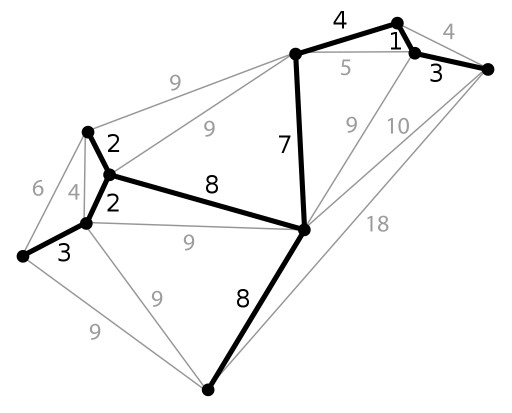

A planar graph and its minimum covering tree. Each edge is labeled with its weight.

<p><a href="https://commons.wikimedia.org/wiki/File:KruskalDemo.gif#/media/File:KruskalDemo.gif"><img src="https://upload.wikimedia.org/wikipedia/commons/b/bb/KruskalDemo.gif" alt="KruskalDemo.gif" height="323" width="314"></a>

Animation of Kruskal's algorithm on a complete graph with weights based on Euclidean distance.

<br>By <a href="https://commons.wikimedia.org/wiki/User:Shiyu_Ji" title="User:Shiyu Ji">Shiyu Ji</a> - <span class="int-own-work" lang="en">Own work</span>, <a href="https://creativecommons.org/licenses/by-sa/4.0" title="Creative Commons Attribution-Share Alike 4.0">CC BY-SA 4.0</a>, <a href="https://commons.wikimedia.org/w/index.php?curid=54420893">Link</a></p>

### Kruskal's Maze Generation Algorithm

Kruskal's algorithm can be used to generate mazes in a quite interesting way. Here is the theory behind this process:

1. Create a list of all walls, and create a set for each cell, each containing only that cell.
2. For each wall, in random order:
   - If the cells divided by this wall belong to different sets:
      - Remove the wall between the cells.
      - Unite the sets of the cells divided by the wall.

There are various data structures that can be used to model the sets of cells. An efficient implementation that uses a disjoint-set data structure can perform each union and find operation on two sets in almost constant amortized time.

### Disjoint-set Data Structure

A disjoint-set data structure is a data structure that stores a collection of disjoint (non-overlapping) sets. Equivalently, it stores a partition of a set into disjoint subsets. This structure allows adding new sets, merging sets (replacing them with their union), and finding a representative member of a set. This latter operation efficiently determines whether any two elements are in the same or different sets.

For our application, we use an implementation called **disjoint-set forest**. This is a specialized type of forest that performs union and find operations in almost constant amortized time. Disjoint-set forests do not guarantee this performance per operation. Individual union and find operations may take more than constant time, but each operation adjusts the disjoint-set forest to make subsequent operations faster.

#### Representation

Each node in a disjoint-set forest consists of an object `MazeCell`, which has a pointer and some auxiliary information called rank. The pointers are used to create Parent Pointer Trees, where each node that is not the root of a tree points to its parent. Each tree represents one of the disjoint sets stored in the forest, and the tree's elements are the nodes. Root nodes are the set representatives: **Two nodes are in the same set if and only if the roots of the trees containing the nodes are the same.**

#### Operations

- **Making new sets:**  
  When creating a new `MazeCell` object, a new disjoint set is created that represents a single cell of the maze. The parent pointer points to itself, and the rank is initialized to 0.

- **Union by rank:**
  For union by rank, a node stores its rank, which is an upper bound for its height. When a node is initialized, its rank is set to zero. To combine trees with roots `x` and `y`, their ranks are compared first. If the ranks are different, the tree with the higher rank becomes the parent, and the ranks of `x` and `y` do not change. If the ranks are the same, either one can become the parent, but the rank of the new parent is incremented by one.

| 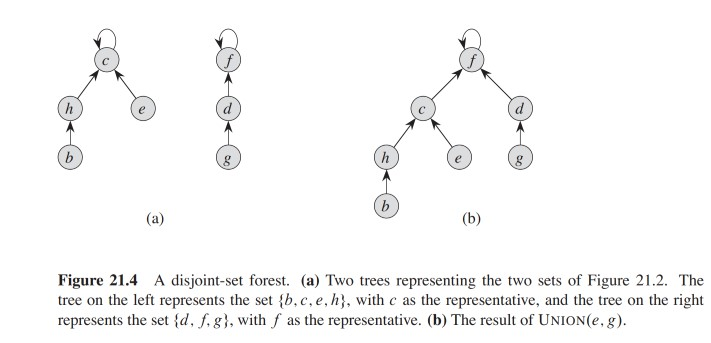 |
|:--:|
| Image taken from <em>Introduction to Algorithms, Third Edition</em> - CLRS|

- **Finding the representative of a set:**  
To find the representative of a set, follow the parent pointers from the node to the root of the tree. The root is the representative of the set. Performing a find operation presents an opportunity to improve the forest: the parent pointers visited during this search can be updated to point closer to the root. Since each element visited on the path to a root is part of the same set, this does not change the sets stored in the forest.  
In this application, the find algorithm used belongs to a family of find algorithms known as **path compression**. The idea is to make each node visited during the search point directly to the root of the tree.  
Path compression can be implemented using a simple recursion as follows:

```python
def find_set(x):
    if x.parent != x:
        x.parent = find_set(x.parent)
    return x.parent
```

| 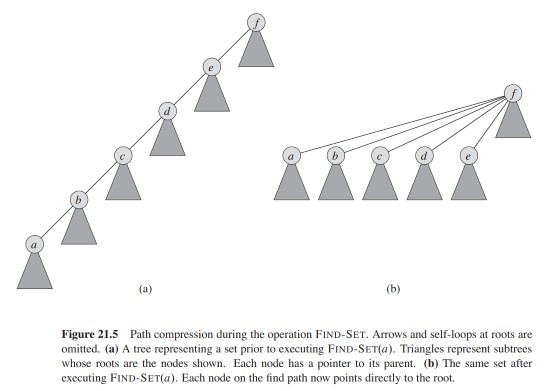 |
|:--:|
| Image taken from <em>Introduction to Algorithms, Third Edition</em> - CLRS|

In [ ]:
class KruskalMaze(Maze):
    """ Class encapsulating the methods necessary to generate a maze using Kruskal's algorithm """
    import networkx as nx

    def __init__(self, rows: int, cols: int, seed: int = None):
        super().__init__(rows, cols, seed)
        self.cells:list[list[MazeCell]] = [ [] for _ in range(rows) ]
        self.walls: list[MazeWall]      = []

        # Initialize cells and walls
        id = 0
        for i in range(rows):
            for j in range(cols):
                self.cells[i].append(MazeCell(i, j, id))
                if i > 0:
                    self.walls.append(MazeWall(self.cells[i-1][j], self.cells[i][j]))
                if j > 0:
                    self.walls.append(MazeWall(self.cells[i][j-1], self.cells[i][j]))
                id += 1

    def find(self, cell: MazeCell) -> MazeCell:
        """ Finds the representative of the set to which the cell belongs.
        using a path compression algorithm """
        if cell.parent != cell:
            cell.parent = self.find(cell.parent)
        return cell.parent

    def union(self, cell1: MazeCell, cell2: MazeCell) -> bool:
        """ Joins the cell sets of cell1 and cell2 using union by rank.
        Returns True if they have been joined and False if they were already joined. """
        root1 = self.find(cell1)
        root2 = self.find(cell2)
        if root1 == root2:
            return True # Ya estaban unidos
        if root1.rank > root2.rank:
            root2.parent = root1
        elif root1.rank < root2.rank:
            root1.parent = root2
        else:
            root2.parent = root1
            root1.rank += 1
        return False # Have joined

    def generate_maze(self, show_graph=True) -> nx.Graph:
        """ Generates the maze using Kruskal's algorithm.
        Returns a networkx graph representing the maze."""
        import random
        import networkx as nx
        import matplotlib.pyplot as plt
        random.seed(self.seed)  # In order to make the maze reproducible
        walls = random.sample(self.walls, len(self.walls))
        for wall in walls:
            """ If the cells divided by this wall belong to different sets
                then the wall is eliminated from the maze """
            wall.in_maze = self.union(wall.cell1, wall.cell2)

        # We create a networkx graph to represent the maze.
        # Each cell is a node and an edge exists between two nodes if they are neighbors and there is no wall between them.
        edge_list = [ (wall.cell1, wall.cell2) for wall in self.walls if not wall.in_maze ]
        graph = nx.Graph(edge_list)
        if show_graph:
            pos = { cell: (cell.y+0.5, cell.x+0.5) for cell in graph.nodes }
            self.plot(show=False)
            nx.draw(graph, pos=pos, node_size=5, edge_color='blue')
            plt.title(f'Representation of the maze as a graph.')
            plt.show()
        return graph

    def plot_pared(self, wall: MazeWall):
        """ Draw a wall using matplotlib """
        import matplotlib.pyplot as plt
        if wall.in_maze:
            """ NOTE: To plot a line between two points (x1, y1) and (x2, y2).
            we use plt.plot([x1, x2], [y1, y2], color='black') """
            if wall.cell1.x == wall.cell2.x:
                #  Vertical wall
                i = wall.cell2.x
                j = wall.cell2.y
                plt.plot([j, j], [i, i+1], color=wall.color)
            elif wall.cell1.y == wall.cell2.y:
                # Horizontal wall
                i = wall.cell2.x
                j = wall.cell2.y
                plt.plot([j, j+1], [i, i], color=wall.color)

    def plot_contorno(self):
        """ Draw the outline of the maze using matplotlib """
        import matplotlib.pyplot as plt
        """ EYE: To plot a line between two points (x1, y1) and (x2, y2).
        we use plt.plot([x1, x2], [y1, y2], color='black') """
        plt.plot([0, self.cols], [0, 0], color='black')
        plt.plot([0, self.cols], [self.rows, self.rows], color='black')
        plt.plot([0, 0], [0, self.rows], color='black')
        plt.plot([self.cols, self.cols], [0, self.rows], color='black')

    def plot(self, show=True) -> None:
        """ Draw the maze using matplotlib """
        import matplotlib.pyplot as plt
        fig, ax = plt.subplots()
        plt.axis('equal')
        # Figure size
        plt.gcf().set_size_inches(7, 7)
        # We plot the contour of the maze
        self.plot_contorno()

        plt.axis('off')

        for wall in self.walls:
            if wall.in_maze:
                self.plot_pared(wall)

        if show: plt.show()

        return fig, ax


    def animate(self):
        """ Generates an animation of Kruskal's algorithm.
        For more details on what each step in the animation means, see the notebook below in the examples section.
        below in the examples section."""

        import matplotlib.pyplot as plt
        from matplotlib.animation import FuncAnimation
        from IPython.display import HTML

        def generate_plot(wall: tuple[int, MazeWall]):
            """For more details on what each step in the animation means, refer to the notebook
            further below in the examples section."""


            ax.set_aspect('equal')
            ax.axis('off')
            self.plot_contorno()

            step = wall[0]
            curr_wall = wall[1]
            if curr_wall is not None:
                curr_cell1 = curr_wall.cell1
                curr_cell2 = curr_wall.cell2

            if step == 0:

                plot_paredes()
                plot_celdas()

            elif step == 1:
                curr_wall.color = 'red'

                ax.add_patch(plt.Rectangle((curr_cell1.y, curr_cell1.x), 1, 1, color='red', alpha=0.3))
                ax.add_patch(plt.Rectangle((curr_cell2.y, curr_cell2.x), 1, 1, color='red', alpha=0.3))

                plot_paredes()
                plot_celdas()

            elif step == 2:
                curr_wall.color = 'blue'

                parent1 = self.find(curr_cell1)
                ax.add_patch(plt.Rectangle((parent1.y, parent1.x), 1, 1, color='green', alpha=0.3))
                ax.add_patch(plt.Rectangle((curr_cell1.y, curr_cell1.x), 1, 1, color='blue', alpha=0.3))

                parent2 = self.find(curr_cell2)
                ax.add_patch(plt.Rectangle((parent2.y, parent2.x), 1, 1, color='green', alpha=0.3))
                ax.add_patch(plt.Rectangle((curr_cell2.y, curr_cell2.x), 1, 1, color='blue', alpha=0.3))

                plot_paredes()
                plot_celdas()

            elif step == 3:
                curr_wall.color = 'black'

                curr_wall.in_maze = self.union(curr_cell1, curr_cell2)

                plot_paredes()
                plot_celdas()

            elif step == -1:
                plot_paredes()

        def plot_paredes():
            for wall in self.walls:
                self.plot_pared(wall)


        def plot_celdas():
            """For each cell in the maze, we are going to print the id of its parent
            in the cell's position."""

            x = max(self.rows, self.cols)
            font_size = 26 - (13*x)/10 + x**2/50

            for i in range(self.rows):
                for j in range(self.cols):
                    cell = self.cells[i][j]
                    plt.text(j + 0.5, i + 0.5, cell.get_parent_id(), ha='center', va='center', color="black", fontsize=font_size)

        # Create a figure and axis
        fig, ax = plt.subplots()
        # Figure size
        fig.set_size_inches(7, 7)

        # Function to update the plot for each frame
        def update(wall: tuple[int, MazeWall]):
            ax.clear()
            generate_plot(wall)

        import random
        import matplotlib as mpl
        random.seed(self.seed)
        walls = random.sample(self.walls, len(self.walls))
        # For each wall we have 4 frames in the animation:
        frames = [(0, None)] + [ (i, wall) for wall in walls for i in range(1, 3+1) ] + [(-1, None)]



        # Set the embed limit to a larger value (in MB)
        mpl.rcParams['animation.embed_limit'] = 50

        # Create the animation
        ani = FuncAnimation(fig, update, frames=frames, interval=500)
        ani_jshtml = ani.to_jshtml()
        plt.close()

        # Display the animation in the notebook
        return HTML(ani_jshtml)




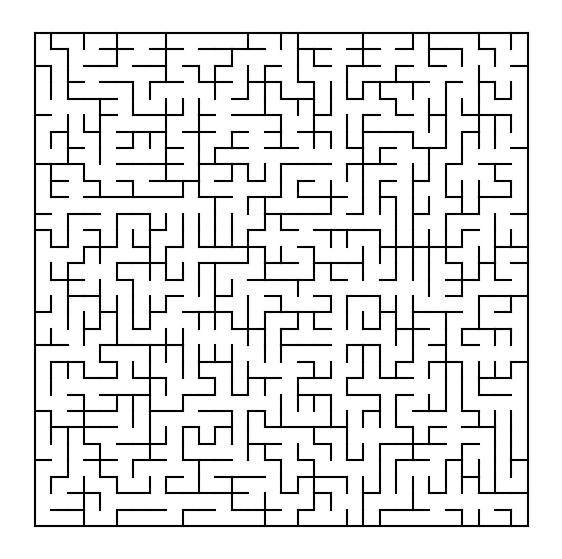

(<Figure size 700x700 with 1 Axes>, <Axes: >)

In [ ]:
mymaze = KruskalMaze(30, 30)
mymaze.generate_maze(show_graph=False)
mymaze.plot()

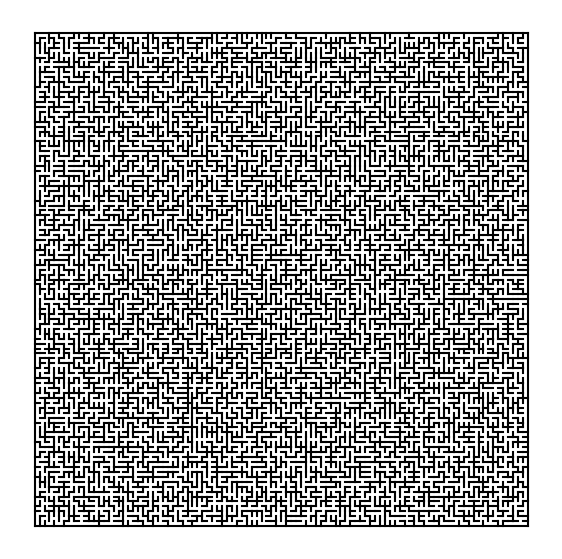

(<Figure size 700x700 with 1 Axes>, <Axes: >)

In [ ]:
mymaze = KruskalMaze(100, 100)
mymaze.generate_maze(show_graph=False)
mymaze.plot()

### Animation

The animation shows the process of generating a maze using Kruskal's algorithm.  
Each cell in the maze contains the `id` of its parent in the disjoint-set forest. At the beginning of the algorithm, each cell is in a different set, so each cell has itself as its parent.  
In each iteration:
1. A random wall is selected. This wall and the cells it divides are painted <font color="red">red</font>.
2. A find operation is performed on both cells. This may update the `id` of the parent of the cells in question and other cells in the maze thanks to path compression. The new `id` of the parent of each cell is written. The two cells in question are painted <font color="blue">blue</font>, and their respective parents are painted <font color="green">green</font>.
3. If the representatives (parents) are the same, the wall is left intact. If the representatives are different, the wall is removed, and the sets are merged. When merging the sets, the parent of the cell with lower rank becomes a child of the parent of the cell with higher rank, thus updating its `id` in the maze. The cells and the wall are unpainted.

In [ ]:
maze = KruskalMaze(5, 5, seed=0)
maze.animate()

## **MAZE SOLVING**: Dead-End Filling Algorithm

The dead-end filling algorithm is an algorithm for solving mazes that fills in all dead ends, leaving only the correct paths unfilled. It can be used to solve mazes on paper or with a computer program, but it is not useful for a person inside an unknown maze, as this method examines the entire maze at once.

The procedure is as follows:
1. Find all dead ends in the maze, and then
2. "fill in" the path from each dead end until reaching the first junction.

Note that some dead ends will not be filled until other dead ends are filled first.

Every dead end has a start and a path that connects it to the correct path, as the maze is a tree. However, the correct path is not filled in (the only way to fill it in is if the initial or final cell were painted), so the dead end filling stops when it encounters the correct path. Additionally, the algorithm does not stop until all dead ends have been filled. A path that does not lead to the final cell eventually becomes a dead end, and thus gets filled in. Thus, the algorithm always terminates and finds the correct path.

In [ ]:
class DeadEndFillingSolver:
    """ Class that encapsulates the methods needed to solve a maze using the Dead-end filling algorithm """

    def __init__(self, maze: Maze):
        self.maze = maze
        self.maze_graph = maze.generate_maze()

    def is_start_or_end(self, node: MazeCell) -> bool:
        """ Returns True if the node is the start node or the goal node """
        return node.xy == (0,0) or node.xy == (self.maze.rows-1, self.maze.cols-1)

    def solve_and_animate_v1(self):
        import matplotlib.pyplot as plt
        from matplotlib.animation import FuncAnimation
        from IPython.display import HTML
        import matplotlib as mpl

        # Create a figure and axis
        fig, ax = self.maze.plot(show=False)
        # Tamaño de la figura
        fig.set_size_inches(7, 7)

        def update(frame: list[MazeCell]):
            for celda in frame:
                    ax.add_patch(plt.Rectangle((celda.y, celda.x), 1, 1, color=celda.color, alpha=0.3))


        def gen_function() -> list[MazeCell]:
            """ Generator that returns the next step of the solution.
            Let's assume that the starting position is the lower left corner
            and the goal is the upper right corner """

            maze_graph = self.maze_graph.copy()

            yield []

            deadends = []
            # The first step is to find the 'dead-ends' of the maze
            # If a node X in the graph, different from the start and end nodes
            # has only one neighbor, then X is a 'dead-end'.
            for node in maze_graph.nodes:
                if not self.is_start_or_end(node):
                    if maze_graph.degree(node) == 1:
                        node.color = 'red'
                        node.visited = True
                        deadends.append(node)
                        yield [node]

            # The second step is to fill in the path from the deadends until it meets the first junction.
            # For this, let's consider the neighbors of the deadends as candidates to be filled in.
            candidates_deadends = set()
            for node in deadends:
                neighbor_node = list(maze_graph.neighbors(node))[0]
                candidates_deadends.add(neighbor_node)
                maze_graph.remove_edge(node, neighbor_node) # Delete the edge between the deadend and its neighbor

            while len(deadends) > 0:

                deadends = [] # The cells added to this list will be filled
                for node in candidates_deadends:
                    # We evaluate if we encounter a junction, and if not, we add it to the list of deadends
                    if maze_graph.degree(node) == 1 and not self.is_start_or_end(node):
                        node.color = 'blue'
                        deadends.append(node)

                yield deadends # Cells in deadends are filled in

                candidates_deadends = set() # Cells added to this set will be candidates to be filled.
                for node in deadends:
                    neighbor_node = list(maze_graph.neighbors(node))[0] # deadend only has one neighbor
                    candidates_deadends.add(neighbor_node)
                    # We delete the edge between the deadend and its neighbor.
                    maze_graph.remove_edge(node, neighbor_node)


        # Set the embed limit to a larger value (in MB)
        mpl.rcParams['animation.embed_limit'] = 50

        # Create the animation
        ani = FuncAnimation(fig, update, frames=gen_function, interval=200, cache_frame_data=False)
        ani_jshtml = ani.to_jshtml()
        plt.close()

        # Display the animation in the notebook
        return HTML(ani_jshtml)

    def solve_and_animate_v2(self):
        import matplotlib.pyplot as plt
        from matplotlib.animation import FuncAnimation
        from IPython.display import HTML
        import matplotlib as mpl

        # Create a figure and axis
        fig, ax = self.maze.plot(show=False)
        # Tamaño de la figura
        fig.set_size_inches(7, 7)

        def update(celda: MazeCell):
            ax.add_patch(plt.Rectangle((celda.y, celda.x), 1, 1, color=celda.color, alpha=0.3))


        def gen_function() -> MazeCell:
            """ Generator that returns the next step of the solution.
            Let's assume that the starting position is the lower left corner
            and the goal is the upper right corner """

            yield MazeCell(0,0)

            maze_graph = self.maze_graph.copy()

            for node in maze_graph.nodes:
                if not self.is_start_or_end(node):
                    if maze_graph.degree(node) == 1:
                        node.color = 'red'
                        yield node

                        neighbor_node = list(maze_graph.neighbors(node))[0]
                        maze_graph.remove_edge(node, neighbor_node)
                        node = neighbor_node
                        while maze_graph.degree(node) == 1 and not self.is_start_or_end(node):
                            node.color = 'blue'
                            yield node
                            neighbor_node = list(maze_graph.neighbors(node))[0]
                            maze_graph.remove_edge(node, neighbor_node)
                            node = neighbor_node


        # Set the embed limit to a larger value (in MB)
        mpl.rcParams['animation.embed_limit'] = 50

        # Create the animation
        ani = FuncAnimation(fig, update, frames=gen_function, interval=200, cache_frame_data=False)
        ani_jshtml = ani.to_jshtml()
        plt.close()

        # Display the animation in the notebook
        return HTML(ani_jshtml)


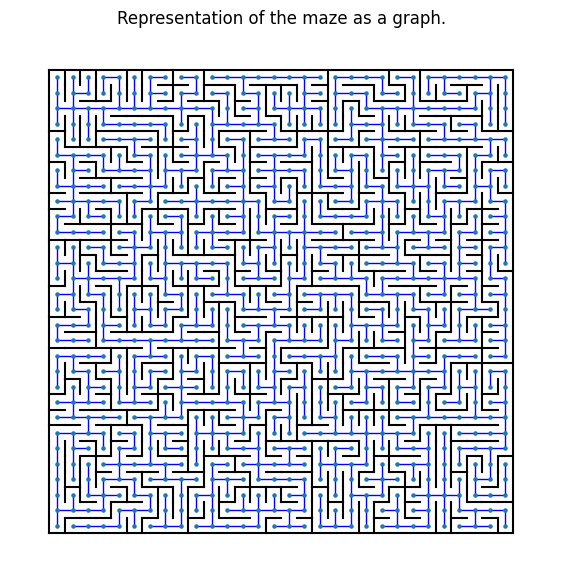

In [ ]:
my_maze = KruskalMaze(30, 30)
my_solver = DeadEndFillingSolver(my_maze)

### Animation - v1

The first animation illustrates the initial implementation of the algorithm that could be conceived.
First, all dead ends of the maze are searched for, and then they are all filled simultaneously until they encounter a junction.

In [ ]:
my_solver.solve_and_animate_v1()

### Animation - v2

The second animation illustrates a second implementation of the algorithm.  
First a dead end is searched for and filled until a junction is encountered. Then another dead end is searched for and filled until a junction is encountered. And so on until there are no more dead ends.

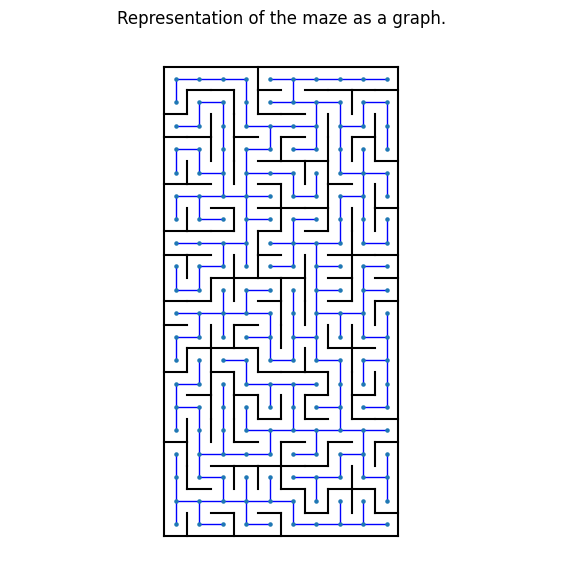

In [ ]:
my_maze = KruskalMaze(20, 10)
my_solver = DeadEndFillingSolver(my_maze)
my_solver.solve_and_animate_v2()